In [ ]:
import torch 
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt

%load_ext tensorboard

In [ ]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cuda:0'

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
transform = transforms.Compose([
    transforms.CenterCrop(128),
    transforms.Resize(64),
    transforms.ToTensor()    
])

In [ ]:
train_dataset = datasets.CelebA(root='./', download=True, split='all', transform=transform)

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

In [ ]:
train_loader = DataLoader(dataset=train_dataset, batch_size=256, shuffle=True, drop_last=True)

Посмотрим на данные:

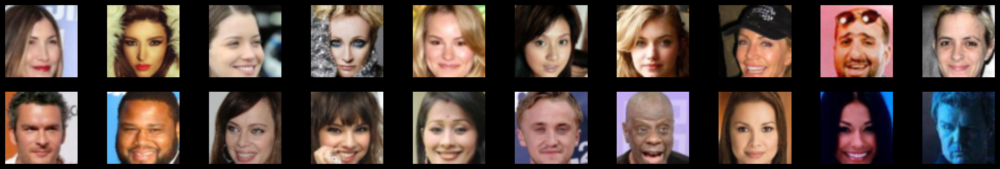

In [ ]:
samples, _ = iter(train_loader).__next__()

k = 0
f, ax = plt.subplots(2, 10, figsize=(25, 4), facecolor='black')

for i in range(2):
    for j in range(10):    
        ax[i, j].imshow(np.rollaxis(samples[k].numpy(), 0, 3))
        ax[i, j].axis('off')

        k += 1

plt.show() 

Определим тренировочную функцию:

In [ ]:
def train(path,
          num_epochs,
          generator,
          discriminator,
          generator_optimizer,
          discriminator_optimizer,
          train_loader,          
          loss_func,
          device=device
    ):
  
    generator.train()
    discriminator.train()

    writer = SummaryWriter(path)    
    images_for_epoch = {}

    for epoch in tqdm(range(num_epochs)):

        for i, (real_images, _) in enumerate(train_loader):

            # лосс дискриминатора на реальных картинках
            discriminator_optimizer.zero_grad()
            real_images = real_images.to(device)            
            real_preds = discriminator(real_images)
            real_targets = torch.ones(size=(real_images.size(0), 1), device=device)
            real_disc_loss = loss_func(real_preds, real_targets)
            real_disc_loss.backward()

            # лосс дискиминатора на сгенерированных картинках
            latent = torch.randn((real_images.size(0), 100, 1, 1), device=device)
            fake_images = generator(latent)
            fake_preds = discriminator(fake_images)
            fake_targets = torch.zeros(size=(real_images.size(0), 1), device=device)
            fake_disc_loss = loss_func(fake_preds, fake_targets)
            fake_disc_loss.backward()

            # оптимизация дискриминатора
            discriminator_optimizer.step()

            # суммарный лосс
            disc_loss = real_disc_loss + fake_disc_loss
            writer.add_scalar('Discriminator_loss', disc_loss, epoch*len(train_loader) + i)            

            #оптимизация генератора
            generator_optimizer.zero_grad()
            generated_images = generator(latent)
            preds = discriminator(generated_images)
            targets = torch.ones(size=(real_images.size(0), 1), device=device)
            gen_loss = loss_func(preds, targets)
            writer.add_scalar('Generator_loss', gen_loss, epoch*len(train_loader) + i)
            gen_loss.backward()
            generator_optimizer.step()
            
        with torch.no_grad():
            images = generated_images[:64].cpu()
            images_for_epoch[epoch] = images.tolist()
            image_grid = torchvision.utils.make_grid(images)
            writer.add_image('Generated_images', image_grid, epoch)
    
    writer.close()
    return generator.eval(), discriminator.eval(), images_for_epoch

Функция инициализации весов:

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# DCGAN

Определим класс генератора:
(Trainable params: 3,576,704)

In [ ]:
class DC_Generator(nn.Module):
    def __init__(self,):
        super(DC_Generator, self).__init__()
        
        self.convtransp1 = nn.ConvTranspose2d(100, 512, 4, 1, 0, bias=False)
        self.batchnorm1 = nn.BatchNorm2d(512)

        self.convtransp2 = nn.ConvTranspose2d(512, 256, 4, 2, 1, bias=False)
        self.batchnorm2 = nn.BatchNorm2d(256)

        self.convtransp3 = nn.ConvTranspose2d(256, 128, 4, 2, 1, bias=False)
        self.batchnorm3 = nn.BatchNorm2d(128)

        self.convtransp4 = nn.ConvTranspose2d(128, 64, 4, 2, 1, bias=False)
        self.batchnorm4 = nn.BatchNorm2d(64)

        self.convtransp5 = nn.ConvTranspose2d(64, 3, 4, 2, 1, bias=False)

        self.relu = nn.ReLU()
        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.convtransp1(x)
        x = self.relu(self.batchnorm1(x))

        x = self.convtransp2(x)
        x = self.relu(self.batchnorm2(x))

        x = self.convtransp3(x)
        x = self.relu(self.batchnorm3(x))

        x = self.convtransp4(x)
        x = self.relu(self.batchnorm4(x))

        x = self.convtransp5(x)
        output = self.tanh(x)
        return output

Определим класс дискриминатора: (Trainable params: 2,765,568)

In [ ]:
class DC_Discriminator(nn.Module):
    def __init__(self):
        super(DC_Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(3, 64, 4, 2, 1, bias=False)

        self.conv2 = nn.Conv2d(64, 128, 4, 2, 1, bias=False)
        self.batchnorm2 = nn.BatchNorm2d(128)

        self.conv3 = nn.Conv2d(128, 256, 4, 2, 1, bias=False)
        self.batchnorm3 = nn.BatchNorm2d(256)

        self.conv4 = nn.Conv2d(256, 512, 4, 2, 1, bias=False)
        self.batchnorm4 = nn.BatchNorm2d(512)

        self.conv5 = nn.Conv2d(512, 1, 4, 1, 0, bias=False)

        self.flatten = nn.Flatten()
        self.relu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, x):
        x = self.relu(self.conv1(x))

        x = self.conv2(x)
        x = self.relu(self.batchnorm2(x))

        x = self.conv3(x)
        x = self.relu(self.batchnorm3(x))

        x = self.conv4(x)
        x = self.relu(self.batchnorm4(x))

        x = self.conv5(x)
        output = self.sigmoid(self.flatten(x))
        return output

In [ ]:
net_g = DC_Generator().to(device)
net_d = DC_Discriminator().to(device)

net_g.apply(weights_init)
net_d.apply(weights_init)

optimizer_g = optim.Adam(net_g.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_d = optim.Adam(net_d.parameters(), lr=2e-4, betas=(0.5, 0.999))

loss_function = nn.BCELoss()

In [ ]:
net_g, net_d, images = train('logs/DCGAN', 10, net_g, net_d, optimizer_g, optimizer_d, train_loader, loss_function)

100%|██████████| 10/10 [20:40<00:00, 124.03s/it]


In [ ]:
torch.save(net_g.state_dict(), 'DCGAN_Generator.pt')
torch.save(net_d.state_dict(), 'DCGAN_Discriminator.pt')
torch.save(images, 'DCGAN_images')

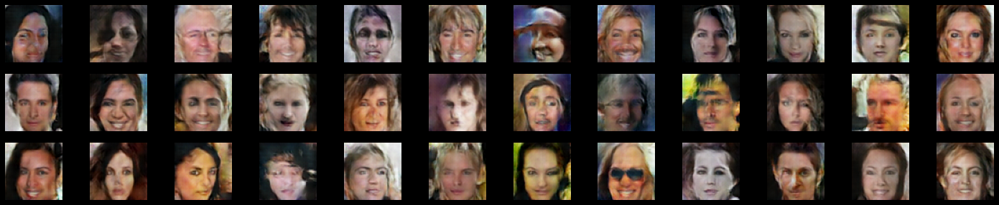

In [ ]:
f, ax = plt.subplots(3, 12, figsize=(25, 5), facecolor='black')
  
for i in range(3):
    for j in range(12):        
        latent = torch.randn((1, 100, 1, 1), device=device)
        img = net_g(latent).squeeze(0).cpu().detach()
        img = img.numpy()
        ax[i, j].imshow(np.rollaxis(img, 0, 3))
        ax[i, j].axis('off')

plt.show() 

# DCGAN на CSP-блоках

Определим класс генератора: (Trainable params: 3,253,568)

In [ ]:
class Generator(nn.Module):

    def __init__(self):
        super(Generator, self).__init__()

        self.convtransp = nn.ConvTranspose2d(in_channels=100, out_channels=512, kernel_size=2, bias=False)

        self.batchnorm = nn.BatchNorm2d(512)
        
        self.cspup1_1 = nn.Sequential(
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(256),            
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=2, stride=2, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1, bias=False),
        )
        
        self.cspup1_2 = nn.ConvTranspose2d(in_channels=256, out_channels=256, kernel_size=2, stride=2, bias=False)

        self.batchnorm1 = nn.BatchNorm2d(256)

        self.cspup2_1 = nn.Sequential(
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),            
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=2, stride=2, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=128, out_channels=128, kernel_size=3, stride=1, padding=1, bias=False),
        )
        
        self.cspup2_2 = nn.ConvTranspose2d(in_channels=128, out_channels=128, kernel_size=2, stride=2, bias=False)

        self.batchnorm2 = nn.BatchNorm2d(128)

        self.cspup3_1 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(64),         
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=2, stride=2, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=64, out_channels=64, kernel_size=3, stride=1, padding=1, bias=False),
        )
        
        self.cspup3_2 = nn.ConvTranspose2d(in_channels=64, out_channels=64, kernel_size=2, stride=2, bias=False)

        self.batchnorm3 = nn.BatchNorm2d(64)

        self.cspup4_1 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(32),          
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(in_channels=32, out_channels=32, kernel_size=2, stride=2, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Conv2d(in_channels=32, out_channels=32, kernel_size=3, stride=1, padding=1, bias=False),
        )
        
        self.cspup4_2 = nn.ConvTranspose2d(in_channels=32, out_channels=32, kernel_size=2, stride=2, bias=False)

        self.batchnorm4 = nn.BatchNorm2d(32)

        self.convtransp5 = nn.ConvTranspose2d(in_channels=32, out_channels=3, kernel_size=2, stride=2, bias=False)

        self.relu = nn.LeakyReLU(0.2)
        self.tanh = nn.Tanh()

    def forward(self, x):
        x = self.convtransp(x)
        x = self.relu(self.batchnorm(x))

        x_1, x_2 = torch.split(x, 256, dim=1)
        x = self.cspup1_1(x_1) + self.cspup1_2(x_2)
        x = self.relu(self.batchnorm1(x))

        x_1, x_2 = torch.split(x, 128, dim=1)
        x = self.cspup2_1(x_1) + self.cspup2_2(x_2)
        x = self.relu(self.batchnorm2(x))

        x_1, x_2 = torch.split(x, 64, dim=1)
        x = self.cspup3_1(x_1) + self.cspup3_2(x_2)
        x = self.relu(self.batchnorm3(x))

        x_1, x_2 = torch.split(x, 32, dim=1)
        x = self.cspup4_1(x_1) + self.cspup4_2(x_2)
        x = self.relu(self.batchnorm4(x))

        output = self.tanh(self.convtransp5(x))
        return output       

Определим класс дискриминатора: (Trainable params: 2,789,312)

In [ ]:
class Discriminator(nn.Module):

    def __init__(self):
        super(Discriminator, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=32, kernel_size=4, stride=2, padding=1, bias=False)
        self.batchnorm1 = nn.BatchNorm2d(32)

        self.conv2 = nn.Conv2d(in_channels=32, out_channels=64, kernel_size=4, stride=2, padding=1, bias=False)
        self.batchnorm2 = nn.BatchNorm2d(64)

        self.conv3 = nn.Conv2d(in_channels=64, out_channels=128, kernel_size=4, stride=2, padding=1, bias=False)
        self.batchnorm3 = nn.BatchNorm2d(128)

        self.conv4 = nn.Conv2d(in_channels=128, out_channels=256, kernel_size=4, stride=2, padding=1, bias=False)
        self.batchnorm4 = nn.BatchNorm2d(256)

        self.conv5 = nn.Conv2d(in_channels=256, out_channels=512, kernel_size=4, bias=False)
        self.batchnorm5 = nn.BatchNorm2d(512)

        self.conv6 = nn.Conv2d(in_channels=512, out_channels=1, kernel_size=1, bias=False)

        self.relu = nn.LeakyReLU(0.2)
        self.sigmoid = nn.Sigmoid()
        self.flatten = nn.Flatten()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu(self.batchnorm1(x))

        x = self.conv2(x)
        x = self.relu(self.batchnorm2(x))

        x = self.conv3(x)
        x = self.relu(self.batchnorm3(x))

        x = self.conv4(x)
        x = self.relu(self.batchnorm4(x))
        
        x = self.conv5(x)
        x = self.relu(self.batchnorm5(x))

        x = self.conv6(x)
                
        output = self.sigmoid(self.flatten(x))
        return output

23 эпохи, без регуляризаций, вероятно модколлапс

In [ ]:
gen_net = Generator().to(device)
disc_net = Discriminator().to(device)

gen_net.apply(weights_init)
disc_net.apply(weights_init)

gen_optimizer = optim.Adam(gen_net.parameters(), lr=1e-4)
disc_optimizer = optim.Adam(disc_net.parameters(), lr=2e-4)

loss_function = nn.BCELoss()

In [ ]:
gen_net, disc_net, images = train('logs/CSPGAN_8', 10, gen_net, disc_net, gen_optimizer, disc_optimizer, train_loader, loss_function)

100%|██████████| 10/10 [47:02<00:00, 282.25s/it]


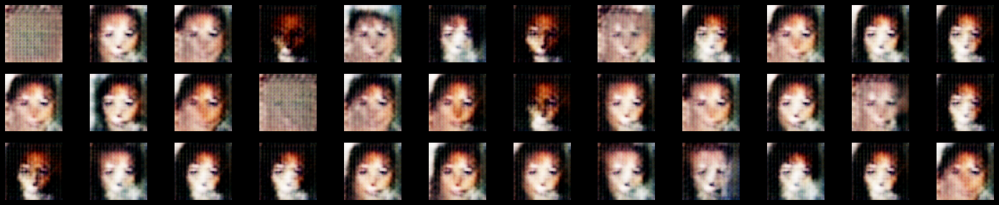

In [ ]:
f, ax = plt.subplots(3, 12, figsize=(25, 5), facecolor='black')
  
for i in range(3):
    for j in range(12):        
        latent = torch.randn((1, 100, 1, 1), device=device)
        img = gen_net(latent).squeeze(0).cpu().detach()
        img = img.numpy()
        ax[i, j].imshow(np.rollaxis(img, 0, 3))
        ax[i, j].axis('off')

plt.show() 

In [ ]:
torch.save(gen_net.state_dict(), 'CSP_Generator.pt')
torch.save(disc_net.state_dict(), 'CSP_Discriminator.pt')
torch.save(images, 'CSP_images')

Несмотря на то, что лица людей выглядят так, как будто это фильм ужасов, да ещё и модколлапс, можно сказать, что это уже частичный успех, поскольку моделька генерирует хоть что-то похожее на лица, а не просто шум и разноцветные пиксельные узоры